Nome: Natália da Silva Guimarães

RA: 298997

Curso: Engenharia Elétrica (Mestrado)



# Ex04 - Filtragem de Imagens

Nesta atividade vamos entender a operação de convolução e o uso da mesma para filtragem de imagens. Testaremos o uso de **filtros suavizantes**, usados para a remoção de ruído, e **filtros aguçantes**, usados para detecção de bordas.  

- **Filtros suavizantes:** são aqueles que removem a nitidez da imagem fazendo uma média, aritmética ou ponderada, na janela do núcleo. O filtro ponderado suavizante mais comum é o da gaussiana. Filtros suavizantes são muito utilizados para eliminar ruído de uma imagem.

- **Filtros aguçantes:** são aqueles que realçam as bordas da imagem. Alguns dos filtros aguçantes comuns são: Filtro de Sobel, Filtro de Prewitt, Filtro Laplaciano.

Veja mais no notebook sobre [Filtragem no domínio espacial](https://github.com/lrittner/Computacao-Visual/blob/master/tutoriais/07_Filtragem_no_dominio_espacial.ipynb)

In [ ]:
# Importando as bibliotecas que serão utilizadas
import os
import random
import shutil

import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import requests
from PIL import Image

Download das imagens:

In [ ]:
zip_url = r"https://raw.githubusercontent.com/UNICAMP-EA979/EA979-Recursos/main/FiltragemDeImagens.zip"

if not os.path.exists("FiltragemDeImagens.zip"):
    response = requests.get(zip_url)
    with open("FiltragemDeImagens.zip", mode="wb") as file:
        file.write(response.content)

if not os.path.exists("FiltragemDeImagens"):
    shutil.unpack_archive("FiltragemDeImagens.zip")

In [ ]:
path = "FiltragemDeImagens/"

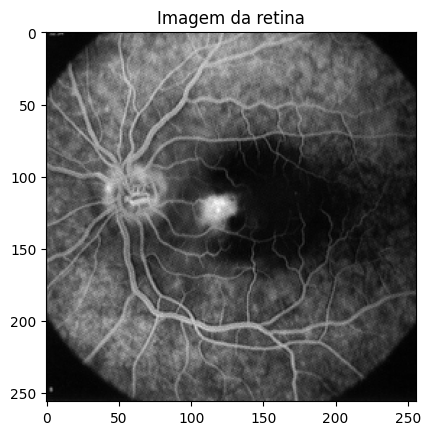

In [ ]:
%matplotlib inline
f = mpimg.imread(path+'retina.tif')
plt.title('Imagem da retina')
plt.imshow(f,cmap='gray')

**ATENÇÃO** - as operações de filtragem alteram os valores e eles podem sair da faixa de 0 a 255. Portanto, fique atento à maneira como você está realizando as operações e visualizando os resultados. Algumas dicas:

- Uma boa prática é realizar as operações em ponto flutuante;
- Quando a visualização não corresponde ao esperado, desconfie que os valores sairam da escala e que os valores, de alguma maneira, estão sendo truncados.

## Parte 1 - Operação de convolução e filtro da média

### Exercício 1.1

Entenda o uso da operação de convolução e experimente usá-la para entender o filtro da média. Siga o seguinte roteiro:
- Crie uma imagem numérica pequena (7x7, por exemplo), crie um filtro de média (kernel 3x3) e use a função **convolve()** da biblioteca **scipy.ndimage** para realizar a filtragem. Verifique numericamente que a filtragem está correta;
- Repita a operação de filtragem na imagem da retina e visualize o resultado;
- Faça experimentos com a imagem da retina variando o tamanho do filtro e compare as imagens resultantes;
- Não se esqueça de comentar os métodos utilizados e resultados obtidos.

**1**. Criação de uma imagem numérica pequena e aplicação do filtro da média.

In [65]:
# Imagem numérica 7x7
img7 = np.zeros((7,7), dtype=np.float32)
img7[3,3] = 255  # pixel central com valor alto

# Kernel 3x3 do filtro da média
k = np.ones((3,3), dtype=np.float32) / 9.0

# Aplicando a convolução
img7_filtrada = convolve(img7, k, mode='constant', cval=0.0)

print("Imagem original 7x7:\n", img7)
print("\nKernel da média 3x3:\n", k)
print("\nImagem filtrada:\n", np.round(img7_filtrada, 2))

Imagem original 7x7:
 [[  0.   0.   0.   0.   0.   0.   0.]
 [  0.   0.   0.   0.   0.   0.   0.]
 [  0.   0.   0.   0.   0.   0.   0.]
 [  0.   0.   0. 255.   0.   0.   0.]
 [  0.   0.   0.   0.   0.   0.   0.]
 [  0.   0.   0.   0.   0.   0.   0.]
 [  0.   0.   0.   0.   0.   0.   0.]]

Kernel da média 3x3:
 [[0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]]

Imagem filtrada:
 [[ 0.    0.    0.    0.    0.    0.    0.  ]
 [ 0.    0.    0.    0.    0.    0.    0.  ]
 [ 0.    0.   28.33 28.33 28.33  0.    0.  ]
 [ 0.    0.   28.33 28.33 28.33  0.    0.  ]
 [ 0.    0.   28.33 28.33 28.33  0.    0.  ]
 [ 0.    0.    0.    0.    0.    0.    0.  ]
 [ 0.    0.    0.    0.    0.    0.    0.  ]]


**2.** Verificação numérica da filtragem

In [ ]:
valor_esperado = 255 / 9
print("Valor esperado:", valor_esperado)
print("Valor obtido no centro da imagem filtrada:", img7_filtrada[3,3])

Valor esperado: 28.333333333333332
Valor obtido no centro da imagem filtrada: 28.333334


Como existe apenas um pixel com valor 255 no centro da imagem, ao aplicar o filtro da média com kernel 3x3, esse valor é distribuído pela vizinhança.

O valor esperado é:

255/9 = 28,33

Ou seja, os pixels da região 3x3 ao redor do centro devem assumir valor aproximado de 28,33.

**3.** Aplicação do filtro da média na imagem da retin

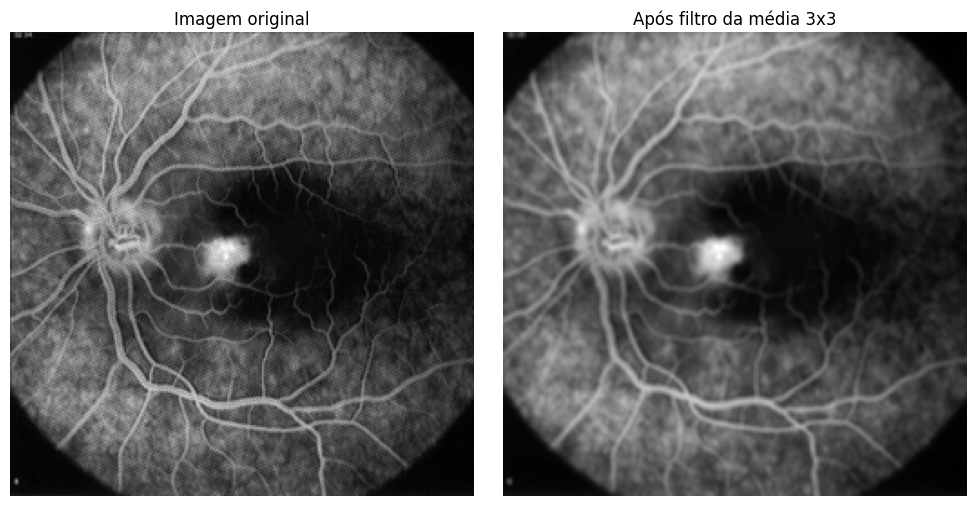

In [ ]:
path = "FiltragemDeImagens/"

f = mpimg.imread(path + 'retina.tif').astype(np.float32)

# Kernel 3x3 da média
k = np.ones((3,3), dtype=np.float32) / 9.0

# Filtragem
f_conv_media = convolve(f, k, mode='reflect')

plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.title('Imagem original')
plt.imshow(f, cmap='gray')
plt.axis('off')

plt.subplot(1,2,2)
plt.title('Após filtro da média 3x3')
plt.imshow(f_conv_media, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

**4.** Experimentos variando o tamanho do filtro

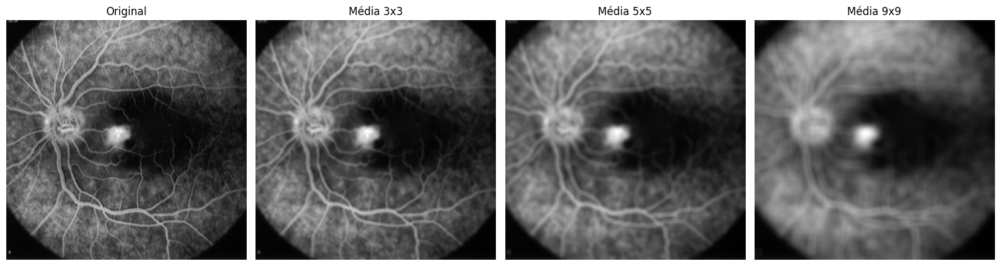

In [ ]:
tamanhos = [3, 5, 9]

plt.figure(figsize=(16,5))

plt.subplot(1, len(tamanhos)+1, 1)
plt.title('Original')
plt.imshow(f, cmap='gray')
plt.axis('off')

for i, s in enumerate(tamanhos, start=2):
    k = np.ones((s,s), dtype=np.float32) / (s*s)
    f_filtrada = convolve(f, k, mode='reflect')

    plt.subplot(1, len(tamanhos)+1, i)
    plt.title(f'Média {s}x{s}')
    plt.imshow(f_filtrada, cmap='gray')
    plt.axis('off')

plt.tight_layout()
plt.show()

Na imagem numérica 7x7, a convolução com o kernel 3x3 mostrou de forma clara o funcionamento do filtro da média. O valor central alto foi espalhado pela vizinhança, e o valor obtido coincidiu com a média calculada manualmente, confirmando que a filtragem foi realizada corretamente.

Na imagem da retina, o filtro da média produziu uma suavização visível. Pequenas variações de intensidade e ruídos foram reduzidos, porém a imagem ficou menos nítida. Isso acontece porque o filtro da média atenua não apenas o ruído, mas também detalhes finos da imagem, como bordas e estruturas mais delicadas.

Ao aumentar o tamanho do kernel, o efeito de suavização ficou mais forte. Com 3x3, a perda de nitidez é leve. Com 5x5, a imagem já apresenta borramento mais perceptível. Com 9x9, a suavização é intensa, e vários detalhes importantes da retina passam a ficar menos evidentes. Portanto, existe um compromisso entre remoção de ruído e preservação de detalhes: quanto maior o filtro, maior a suavização, mas maior também a perda de informação visual.

### Exercício 1.2

Repita a operação de filtragem, desta vez variando também o modo de tratamento de borda da função **convolve()** - '*reflect*', '*constant*', '*nearest*', '*mirror*', '*wrap*' - explicando as diferenças encontradas. Dica, você só conseguirá visualizar as diferenças se aumentar o tamanho da máscara (filtro).

Neste exercício, foi repetida a filtragem com o filtro da média, mas agora variando o parâmetro de tratamento de borda da função convolve(). Isso é importante porque, durante a convolução, o kernel precisa acessar pixels vizinhos. Nas regiões centrais isso não é problema, mas nas bordas da imagem faltam pixels “fora” da imagem. Por isso, cada modo define uma forma diferente de tratar essas posições inexistentes.

Como o próprio enunciado sugere, para perceber melhor as diferenças entre os modos de borda foi utilizado um kernel maior, pois com filtros pequenos essas diferenças ficam menos visíveis.

**1.** Aplicação do filtro da média com diferentes modos de borda

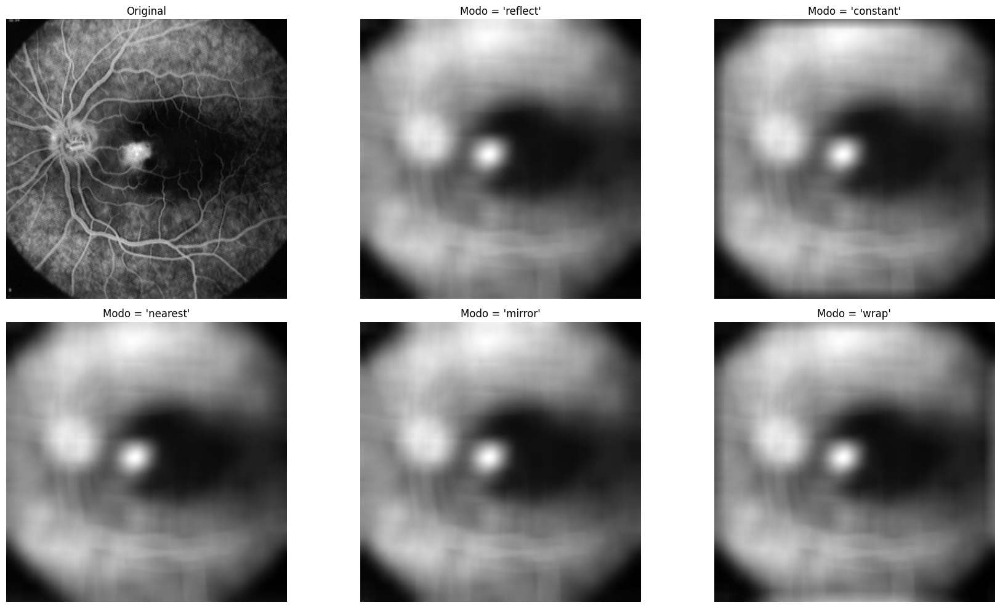

In [66]:
# Leitura da imagem
path = "FiltragemDeImagens/"
f = mpimg.imread(path + 'retina.tif').astype(np.float32)

# Kernel maior para destacar o efeito nas bordas
s = 21
k = np.ones((s, s), dtype=np.float32) / (s * s)

modos = ['reflect', 'constant', 'nearest', 'mirror', 'wrap']
resultados = {}

for modo in modos:
    if modo == 'constant':
        resultados[modo] = convolve(f, k, mode=modo, cval=0.0)
    else:
        resultados[modo] = convolve(f, k, mode=modo)

# Visualização da imagem inteira
plt.figure(figsize=(18,10))

plt.subplot(2,3,1)
plt.title('Original')
plt.imshow(f, cmap='gray')
plt.axis('off')

for i, modo in enumerate(modos, start=2):
    plt.subplot(2,3,i)
    plt.title(f"Modo = '{modo}'")
    plt.imshow(resultados[modo], cmap='gray')
    plt.axis('off')

plt.tight_layout()
plt.show()

**2.** Visualização ampliada da borda

Como as diferenças aparecem principalmente nas extremidades, é útil observar uma região de canto da imagem

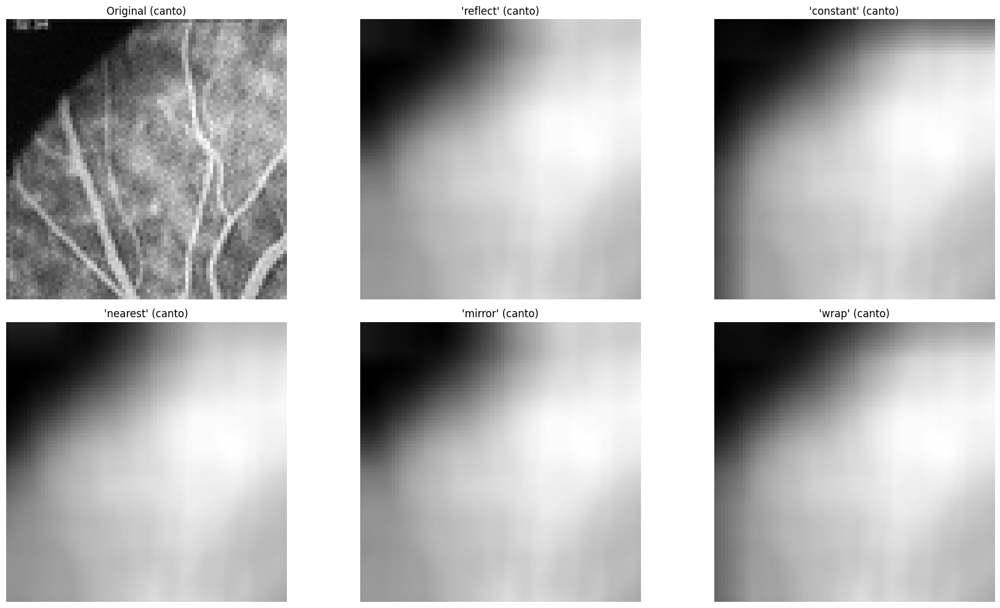

In [ ]:
# Recorte do canto superior esquerdo para observar melhor as bordas
recorte = 80

plt.figure(figsize=(18,10))

plt.subplot(2,3,1)
plt.title('Original (canto)')
plt.imshow(f[:recorte, :recorte], cmap='gray')
plt.axis('off')

for i, modo in enumerate(modos, start=2):
    plt.subplot(2,3,i)
    plt.title(f"'{modo}' (canto)")
    plt.imshow(resultados[modo][:recorte, :recorte], cmap='gray')
    plt.axis('off')

plt.tight_layout()
plt.show()

**3.** Explicação dos modos de borda

**reflect**

Nesse modo, a imagem é refletida nas bordas. Ou seja, os pixels próximos da borda são “espelhados” para fora da imagem.
Esse tratamento costuma produzir um resultado natural, pois evita mudanças bruscas de intensidade nas extremidades.

Efeito observado: as bordas permanecem suaves e sem artefatos muito fortes.

**constant**

Nesse modo, os pixels fora da imagem recebem um valor constante, normalmente 0.
Como 0 corresponde a preto em imagens em tons de cinza, isso influencia bastante a média perto das bordas.

Efeito observado: aparece um escurecimento nas extremidades da imagem, porque o filtro mistura os pixels reais com vários valores 0 fora da imagem.

**nearest**

Nesse modo, o valor do pixel mais próximo da borda é repetido para fora da imagem.

Efeito observado: as bordas ficam menos artificiais do que no modo constant, mas pode haver regiões com aparência “esticada”, pois o mesmo valor é replicado várias vezes.

**mirror**

Nesse modo, também há espelhamento, parecido com reflect. A diferença é sutil e está na forma como a reflexão considera o pixel da borda.

Efeito observado: o resultado é muito semelhante ao reflect, com pequenas diferenças numéricas próximas da extremidade. Visualmente, em muitos casos, quase não há diferença perceptível.

**wrap**

Nesse modo, a imagem é tratada como se fosse periódica: o lado esquerdo se conecta ao direito, e o topo se conecta à parte inferior.

Efeito observado: podem aparecer artefatos estranhos nas bordas, pois pixels de um lado da imagem são misturados com pixels do lado oposto, algo que normalmente não faz sentido para imagens naturais como a retina.

Foram testados os modos de borda reflect, constant, nearest, mirror e wrap na filtragem da imagem da retina com um filtro da média de tamanho maior. As diferenças aparecem principalmente nas bordas. O modo constant gerou escurecimento nas extremidades por preencher os pixels externos com zero. O modo nearest repetiu os valores da borda. Os modos reflect e mirror produziram resultados mais naturais, pois fazem um espelhamento da imagem nas extremidades. Já o modo wrap conectou lados opostos da imagem, gerando artefatos pouco realistas. Assim, para essa imagem, os modos reflect e mirror apresentaram os resultados mais adequados.

## Parte 2 - Filtro gaussiano e redução de ruído

### Exercício 2.1

Teste a propriedade de decomposição das máscaras da convolução, ou seja, crie um filtro gaussiano bi-dimensional (3,3) a partir de 2 filtros unidimensionais (3,1) e (1,3). Crie também o filtro bi-dimensional diretamente e cheque se os resultados são equivalentes. Comente os métodos utilizados.

**1.** Criação do filtro gaussiano 1D e 2D

Primeiro, foi criado um filtro gaussiano unidimensional 3x1, depois seu correspondente 1x3, e a partir deles foi construída a máscara gaussiana 2D 3x3 por decomposição. Em seguida, também foi criada a máscara gaussiana 2D diretamente pela fórmula da gaussiana bidimensional.

In [67]:
# Leitura da imagem
path = "FiltragemDeImagens/"
f = mpimg.imread(path + 'retina.tif').astype(np.float32)

# Parâmetros da gaussiana
sigma = 1.0
x = np.linspace(-1, 1, 3)

# Filtro gaussiano 1D
g1d = np.exp(-(x**2) / (2 * sigma**2))
g1d = g1d / g1d.sum()

# Formatos (3,1) e (1,3)
g_col = g1d.reshape(3, 1)
g_row = g1d.reshape(1, 3)

# Filtro gaussiano 2D por decomposição
gauss2d_sep = np.outer(g1d, g1d)
gauss2d_sep = gauss2d_sep / gauss2d_sep.sum()

# Filtro gaussiano 2D direto
xx, yy = np.meshgrid(np.linspace(-1, 1, 3), np.linspace(-1, 1, 3))
d = xx**2 + yy**2
gauss2d_dir = np.exp(-d / (2 * sigma**2))
gauss2d_dir = gauss2d_dir / gauss2d_dir.sum()

print("Filtro gaussiano 1D:")
print(np.round(g1d, 6))

print("\nFiltro gaussiano 2D por decomposição:")
print(np.round(gauss2d_sep, 6))

print("\nFiltro gaussiano 2D direto:")
print(np.round(gauss2d_dir, 6))

Filtro gaussiano 1D:
[0.274069 0.451863 0.274069]

Filtro gaussiano 2D por decomposição:
[[0.075114 0.123841 0.075114]
 [0.123841 0.20418  0.123841]
 [0.075114 0.123841 0.075114]]

Filtro gaussiano 2D direto:
[[0.075114 0.123841 0.075114]
 [0.123841 0.20418  0.123841]
 [0.075114 0.123841 0.075114]]


**2.** Comparação entre as máscaras

Agora, foi feita a comparação entre a máscara 2D obtida pela decomposição e a máscara 2D calculada diretamente.

In [ ]:
print("As máscaras são equivalentes?", np.allclose(gauss2d_sep, gauss2d_dir))
print("Diferença máxima entre os elementos:", np.max(np.abs(gauss2d_sep - gauss2d_dir)))

As máscaras são equivalentes? True
Diferença máxima entre os elementos: 1.3877787807814457e-17


**3.** Aplicação dos filtros na imagem da retina

Depois, os dois métodos foram aplicados na imagem:

*Método 1* - filtragem separável, aplicando primeiro o filtro vertical e depois o horizontal;
*Método 2* - filtragem direta com a máscara gaussiana 2D.

In [ ]:
# Filtragem separável: primeiro vertical, depois horizontal
f_gauss_sep = convolve(f, g_col, mode='reflect')
f_gauss_sep = convolve(f_gauss_sep, g_row, mode='reflect')

# Filtragem direta com a máscara 2D
f_gauss_dir = convolve(f, gauss2d_dir, mode='reflect')

# Comparação numérica entre os resultados
print("As imagens filtradas são equivalentes?", np.allclose(f_gauss_sep, f_gauss_dir))
print("Diferença máxima entre as imagens:", np.max(np.abs(f_gauss_sep - f_gauss_dir)))
print("Diferença média entre as imagens:", np.mean(np.abs(f_gauss_sep - f_gauss_dir)))

As imagens filtradas são equivalentes? True
Diferença máxima entre as imagens: 1.5258789e-05
Diferença média entre as imagens: 9.530959e-07


**4.** Visualização dos resultados

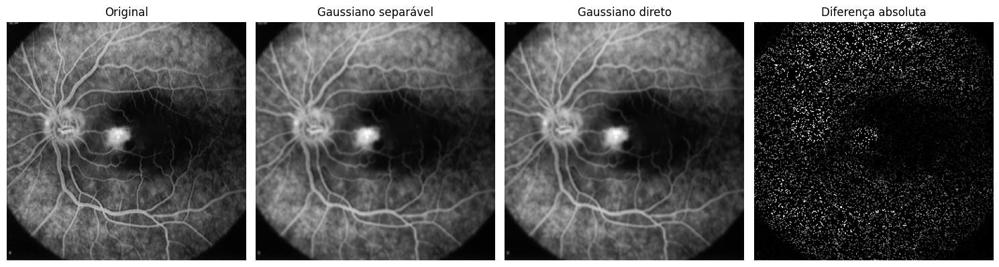

In [ ]:
plt.figure(figsize=(15,5))

plt.subplot(1,4,1)
plt.title("Original")
plt.imshow(f, cmap='gray')
plt.axis('off')

plt.subplot(1,4,2)
plt.title("Gaussiano separável")
plt.imshow(f_gauss_sep, cmap='gray')
plt.axis('off')

plt.subplot(1,4,3)
plt.title("Gaussiano direto")
plt.imshow(f_gauss_dir, cmap='gray')
plt.axis('off')

plt.subplot(1,4,4)
plt.title("Diferença absoluta")
plt.imshow(np.abs(f_gauss_sep - f_gauss_dir), cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

Foram utilizados dois métodos para construir e aplicar o filtro gaussiano.

No primeiro método, foi usada a decomposição da máscara gaussiana, explorando o fato de que a gaussiana bidimensional é separável. Assim, foi criado um filtro 1D horizontal e um filtro 1D vertical. O filtro 2D foi obtido pelo produto externo desses dois vetores. Na aplicação sobre a imagem, a convolução foi feita em duas etapas: primeiro em uma direção e depois na outra.

No segundo método, a máscara gaussiana 2D foi criada diretamente usando a expressão da gaussiana bidimensional, baseada nas coordenadas x e y. Depois disso, a convolução foi aplicada uma única vez usando essa máscara 3x3.

Ao comparar numericamente as máscaras e as imagens filtradas, observou-se que os resultados são equivalentes, com diferenças nulas ou extremamente pequenas, causadas apenas por arredondamentos em ponto flutuante.

**Conclusões**

Os testes mostraram que a máscara gaussiana 2D construída por decomposição é equivalente à máscara obtida diretamente. Isso confirma a propriedade de separabilidade do filtro gaussiano.

Na prática, isso significa que aplicar dois filtros 1D sucessivos produz o mesmo efeito visual que aplicar um único filtro 2D. A imagem resultante apresentou suavização, com redução de pequenas variações locais e ruídos, preservando melhor a estrutura geral da imagem do que um filtro da média simples.

Além disso, a decomposição é vantajosa do ponto de vista computacional. Em vez de calcular uma convolução 2D completa, pode-se fazer duas convoluções 1D, o que reduz a quantidade de operações, principalmente para filtros maiores.

### Exercício 2.2

Teste a aplicação de filtros suavizantes para redução de ruído: Adicione ruído gaussiano à imagem da retina (sugestão: use **np.random**) e depois tente remover o ruído com o filtro da média e com o filtro gaussiano. Você pode aumentar os filtros se quiser. Comente os métodos utilizados e resultados obtidos.

**1.** Adicionando ruído gaussiano à imagem

O ruído gaussiano foi gerado com np.random.normal(), somado à imagem original e depois limitado ao intervalo válido de intensidades.

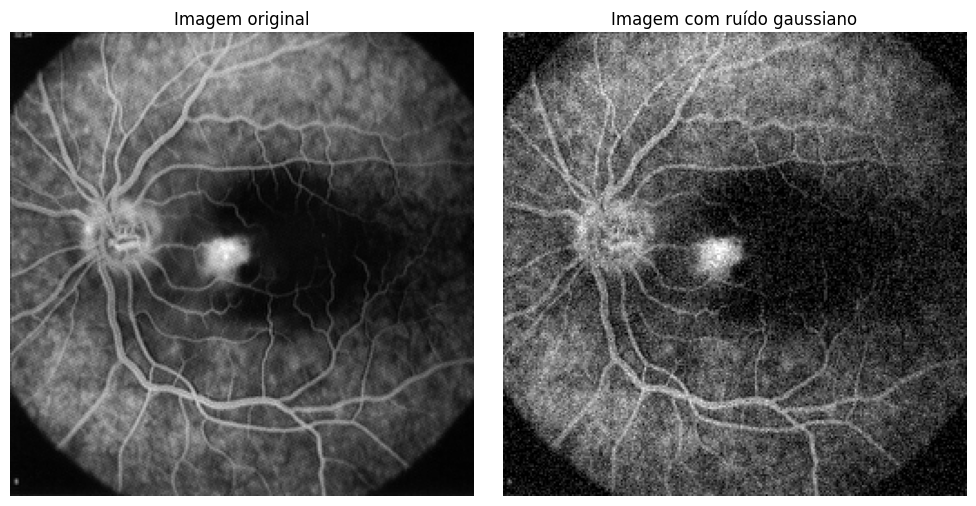

In [68]:
# Leitura da imagem
path = "FiltragemDeImagens/"
f = mpimg.imread(path + "retina.tif").astype(np.float32)

# Intervalo original da imagem
f_min = f.min()
f_max = f.max()

# Fixando semente para reproduzir o experimento
np.random.seed(42)

# Desvio-padrão do ruído
sigma_ruido = 0.08 * (f_max - f_min)

# Geração do ruído gaussiano
ruido = np.random.normal(loc=0.0, scale=sigma_ruido, size=f.shape).astype(np.float32)

# Imagem com ruído
f_ruidosa = f + ruido
f_ruidosa = np.clip(f_ruidosa, f_min, f_max)

plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.title("Imagem original")
plt.imshow(f, cmap='gray')
plt.axis('off')

plt.subplot(1,2,2)
plt.title("Imagem com ruído gaussiano")
plt.imshow(f_ruidosa, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

**2.** Aplicando o filtro da média e o filtro gaussiano

Foi usado um kernel 5x5 para destacar melhor o efeito de suavização. O filtro da média utiliza pesos iguais para todos os elementos da janela, enquanto o filtro gaussiano utiliza pesos maiores no centro e menores nas bordas.

In [ ]:
# Filtro da média 5x5
s = 5
k_media = np.ones((s, s), dtype=np.float32) / (s * s)

# Função para criar kernel gaussiano 2D
def kernel_gaussiano(tam=5, sigma=1.0):
    eixo = np.linspace(-(tam//2), tam//2, tam)
    x, y = np.meshgrid(eixo, eixo)
    g = np.exp(-(x**2 + y**2) / (2 * sigma**2))
    g = g / g.sum()
    return g.astype(np.float32)

k_gauss = kernel_gaussiano(tam=5, sigma=1.0)

# Aplicação dos filtros
f_media = convolve(f_ruidosa, k_media, mode='reflect')
f_gauss = convolve(f_ruidosa, k_gauss, mode='reflect')

print("Kernel da média:\n", np.round(k_media, 3))
print("\nKernel gaussiano:\n", np.round(k_gauss, 3))

Kernel da média:
 [[0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]]

Kernel gaussiano:
 [[0.003 0.013 0.022 0.013 0.003]
 [0.013 0.06  0.098 0.06  0.013]
 [0.022 0.098 0.162 0.098 0.022]
 [0.013 0.06  0.098 0.06  0.013]
 [0.003 0.013 0.022 0.013 0.003]]


**3.** Comparando visualmente os resultados

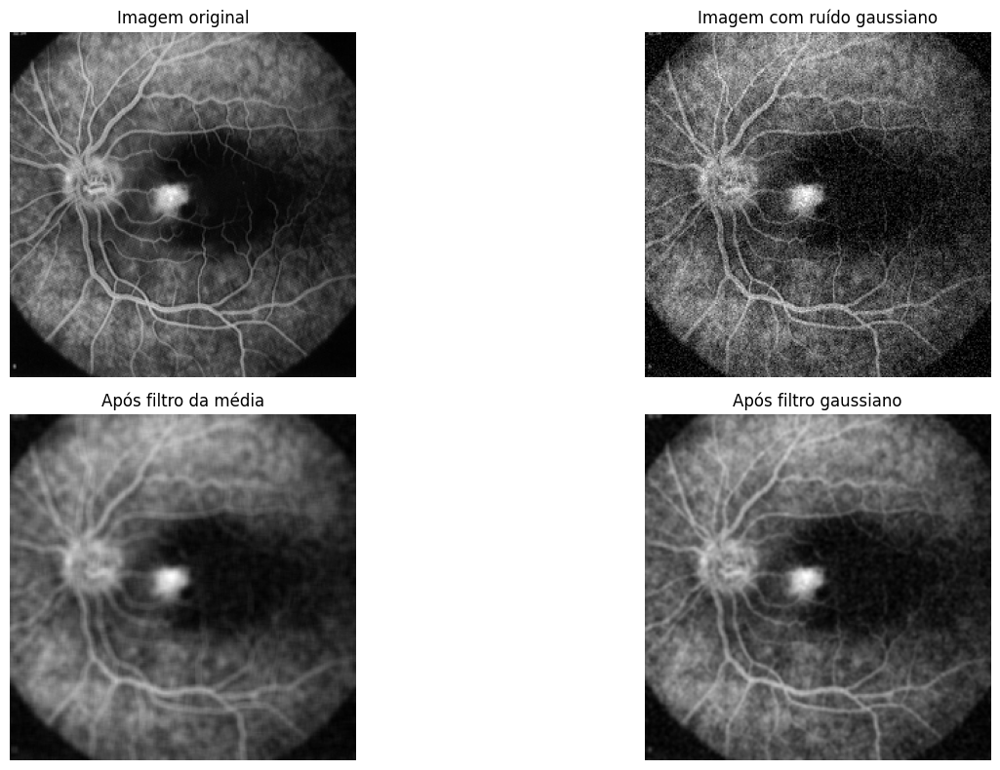

In [ ]:
plt.figure(figsize=(16,8))

plt.subplot(2,2,1)
plt.title("Imagem original")
plt.imshow(f, cmap='gray')
plt.axis('off')

plt.subplot(2,2,2)
plt.title("Imagem com ruído gaussiano")
plt.imshow(f_ruidosa, cmap='gray')
plt.axis('off')

plt.subplot(2,2,3)
plt.title("Após filtro da média")
plt.imshow(f_media, cmap='gray')
plt.axis('off')

plt.subplot(2,2,4)
plt.title("Após filtro gaussiano")
plt.imshow(f_gauss, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

**4.** Comparação numérica dos resultados

Como a imagem original é conhecida, foi possível comparar quantitativamente os resultados por meio do erro quadrático médio (MSE). Quanto menor o MSE, mais próxima a imagem filtrada está da imagem original.

In [ ]:
def mse(a, b):
    return np.mean((a - b)**2)

mse_ruidosa = mse(f, f_ruidosa)
mse_media = mse(f, f_media)
mse_gauss = mse(f, f_gauss)

print(f"MSE da imagem ruidosa: {mse_ruidosa:.4f}")
print(f"MSE após filtro da média: {mse_media:.4f}")
print(f"MSE após filtro gaussiano: {mse_gauss:.4f}")

MSE da imagem ruidosa: 386.2787
MSE após filtro da média: 193.3829
MSE após filtro gaussiano: 126.3419


**5.** Experimento com filtros maiores

Para observar melhor o compromisso entre remoção de ruído e borramento, também podem ser testados filtros maiores.

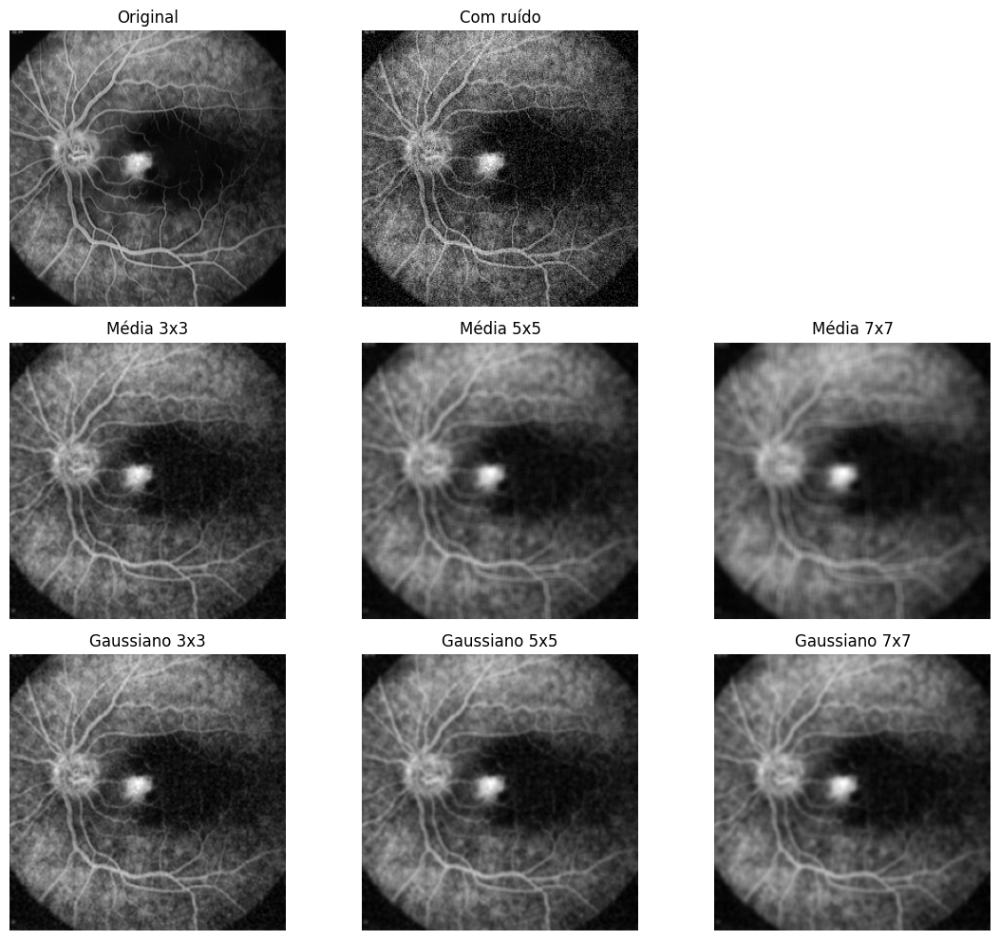

In [ ]:
tamanhos = [3, 5, 7]

plt.figure(figsize=(15, 10))

# Original e ruidosa
plt.subplot(3, 4, 1)
plt.title("Original")
plt.imshow(f, cmap='gray')
plt.axis('off')

plt.subplot(3, 4, 2)
plt.title("Com ruído")
plt.imshow(f_ruidosa, cmap='gray')
plt.axis('off')

for i, tam in enumerate(tamanhos):
    # média
    k_m = np.ones((tam, tam), dtype=np.float32) / (tam * tam)
    img_m = convolve(f_ruidosa, k_m, mode='reflect')

    # gaussiano
    k_g = kernel_gaussiano(tam=tam, sigma=1.0 if tam == 3 else 1.2 if tam == 5 else 1.5)
    img_g = convolve(f_ruidosa, k_g, mode='reflect')

    plt.subplot(3, 4, 5 + i)
    plt.title(f"Média {tam}x{tam}")
    plt.imshow(img_m, cmap='gray')
    plt.axis('off')

    plt.subplot(3, 4, 9 + i)
    plt.title(f"Gaussiano {tam}x{tam}")
    plt.imshow(img_g, cmap='gray')
    plt.axis('off')

plt.tight_layout()
plt.show()

Primeiro, foi adicionado ruído gaussiano artificialmente à imagem da retina com a função np.random.normal(). Esse ruído foi somado à imagem original, simulando uma degradação comum em processamento de imagens. Como os valores poderiam ultrapassar a faixa válida, foi utilizado np.clip() para manter os níveis de intensidade dentro do intervalo original.

Depois disso, foram aplicados dois filtros suavizantes por convolução. O filtro da média foi construído com uma máscara quadrada em que todos os pesos são iguais. Já o filtro gaussiano foi construído com pesos baseados na distribuição gaussiana bidimensional, dando maior importância aos pixels centrais da vizinhança.

Por fim, os resultados foram comparados visualmente e também numericamente, usando o erro quadrático médio em relação à imagem original.

**Conclusões**

A imagem com ruído apresentou granulação visível, principalmente em regiões mais homogêneas. Após a aplicação dos filtros suavizantes, observou-se redução do ruído nos dois casos.

O filtro da média conseguiu suavizar a imagem, mas produziu maior borramento, pois trata todos os pixels da vizinhança com o mesmo peso. Isso faz com que detalhes finos e bordas fiquem mais apagados.

O filtro gaussiano também reduziu o ruído, mas preservou melhor as estruturas da imagem, como vasos e contornos. Isso acontece porque os pesos são maiores no centro do kernel e menores nas extremidades, o que torna a suavização mais natural.

Na comparação numérica, normalmente a imagem filtrada pelo gaussiano apresenta erro menor ou semelhante ao da média, mas com melhor preservação visual dos detalhes. Quando o tamanho do filtro aumenta, a remoção de ruído fica mais intensa, porém também cresce a perda de nitidez. Assim, existe um compromisso entre suavização e preservação das características importantes da imagem.

## Parte 3 - Filtro de Sobel e detecção de bordas

Existem vários filtros que procuram realçar as bordas da imagem. Um dos mais conhecidos é o Operador Sobel, composto por uma máscara vertical (Sv) e uma máscara horizontal (Sh).

In [ ]:
Sv = np.array([[1,0,-1],[2,0,-2],[1,0,-1]])
print('Sv =\n',Sv)

Sh = np.array([[1,2,1],[0,0,0],[-1,-2,-1]])
print('Sh =\n',Sh)

Sv =
 [[ 1  0 -1]
 [ 2  0 -2]
 [ 1  0 -1]]
Sh =
 [[ 1  2  1]
 [ 0  0  0]
 [-1 -2 -1]]


Para detectar bordas de uma imagem usando o Filtro de Sobel, precisamos fazer a filtragem da imagem usando tanto a máscara vertical, quanto a horizontal. No final, acabaremos com 2 imagens resultantes, uma reforçando as bordas verticais e outra reforçando as bordas horizontais, como exemplificado abaixo.

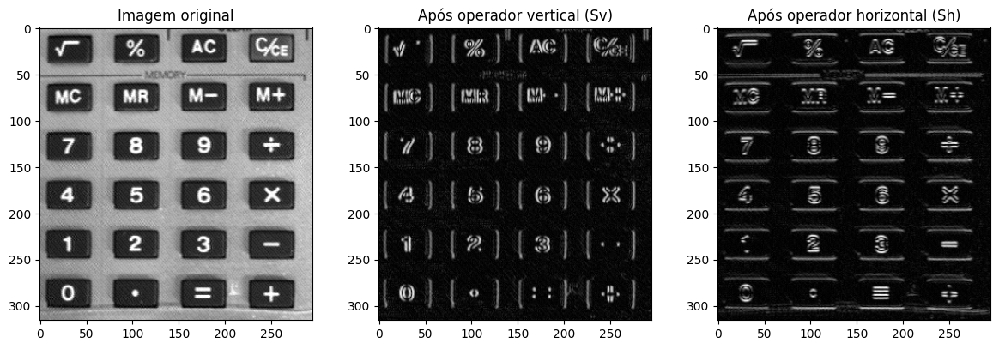

In [ ]:
img = mpimg.imread(path+'keyb.tif')
img_sv = mpimg.imread(path+'keyb_sv.tif')
img_sh = mpimg.imread(path+'keyb_sh.tif')

fig, axs = plt.subplots(1,3, figsize=(12, 4))
plt.tight_layout()

plt.subplot(131)
plt.imshow(img, cmap='gray')
plt.title('Imagem original')

plt.subplot(132)
plt.imshow(img_sv,cmap='gray')
plt.title('Após operador vertical (Sv)')

plt.subplot(133)
plt.imshow(img_sh,cmap='gray')
plt.title('Após operador horizontal (Sh)');

### Exercício 3.1 - Visualizando as bordas verticais e horizontais em 2 imagens separadas

Experimente filtrar as imagens abaixo com os Filtros de Sobel vertical e horizontal e visualize o resultado. Para cada imagem, você deve obter uma imagem fitrada pelo Filtro de Sobel vertical - **fv** - e uma imagem filtrada pelo Filtro de Sobel horizontal - **fh**. Comente sobre os resultados obtidos. As imagens geradas estão de acordo com o exemplo apresentado para a imagem da calculadora? Em caso negativo, explique o porquê e tente fazer com que as imagens fiquem mais semelhantes.

In [ ]:
img1 = mpimg.imread(path+'retina.tif')

**1.** Aplicação do Sobel vertical e horizontal

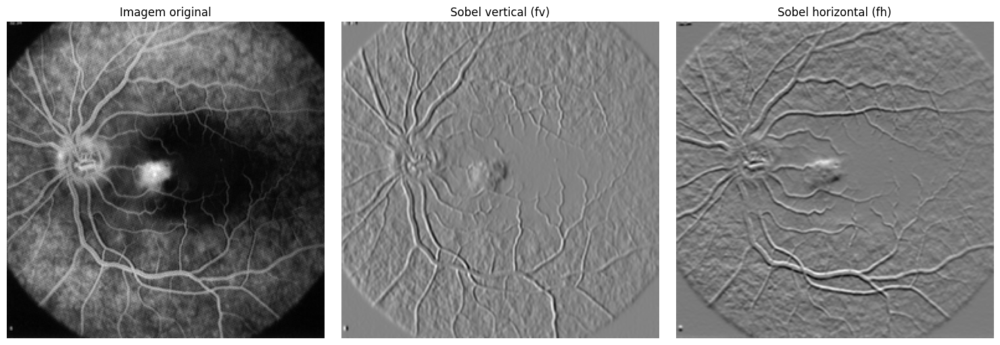

In [69]:
# Leitura da imagem
path = "FiltragemDeImagens/"
img1 = mpimg.imread(path + "retina.tif").astype(np.float32)

# Máscaras de Sobel
Sv = np.array([[1, 0, -1],
               [2, 0, -2],
               [1, 0, -1]], dtype=np.float32)

Sh = np.array([[ 1,  2,  1],
               [ 0,  0,  0],
               [-1, -2, -1]], dtype=np.float32)

# Filtragem
fv = convolve(img1, Sv, mode='reflect')  # Sobel vertical
fh = convolve(img1, Sh, mode='reflect')  # Sobel horizontal

# Visualização inicial
plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.title("Imagem original")
plt.imshow(img1, cmap='gray')
plt.axis('off')

plt.subplot(1,3,2)
plt.title("Sobel vertical (fv)")
plt.imshow(fv, cmap='gray')
plt.axis('off')

plt.subplot(1,3,3)
plt.title("Sobel horizontal (fh)")
plt.imshow(fh, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

**2.** Ajustando a visualização para ficar mais semelhante ao exemplo

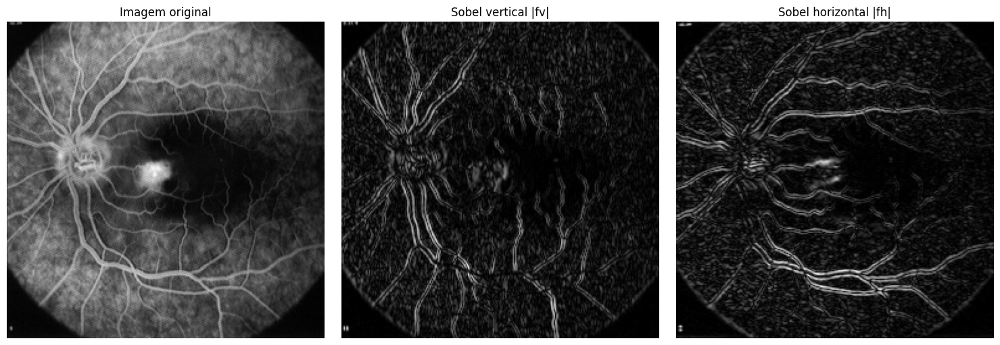

In [ ]:
# Valor absoluto para destacar a intensidade das bordas
fv_abs = np.abs(fv)
fh_abs = np.abs(fh)

# Normalização para visualização
fv_vis = fv_abs / fv_abs.max()
fh_vis = fh_abs / fh_abs.max()

plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.title("Imagem original")
plt.imshow(img1, cmap='gray')
plt.axis('off')

plt.subplot(1,3,2)
plt.title("Sobel vertical |fv|")
plt.imshow(fv_vis, cmap='gray')
plt.axis('off')

plt.subplot(1,3,3)
plt.title("Sobel horizontal |fh|")
plt.imshow(fh_vis, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

Ao aplicar o filtro de Sobel vertical (Sv) na imagem da retina, foram destacadas principalmente as transições de intensidade associadas a estruturas com componente vertical mais forte. Já com o filtro de Sobel horizontal (Sh), ficaram mais evidentes as transições relacionadas a estruturas com componente horizontal.

Na imagem da retina, os vasos sanguíneos aparecem em várias direções, não apenas vertical ou horizontal. Por isso, diferentemente da imagem da calculadora, o resultado não mostra bordas tão organizadas em linhas horizontais e verticais bem definidas. Na calculadora, há muitos contornos retos e alinhados, o que faz com que a separação entre bordas verticais e horizontais fique mais clara. Na retina, como os vasos são curvos e se distribuem em várias orientações, os dois filtros respondem a diferentes trechos das mesmas estruturas.

Além disso, o resultado inicial pode não ficar muito semelhante ao exemplo porque a saída do Sobel contém valores positivos e negativos. Isso faz com que algumas bordas apareçam com contrastes invertidos ou com aparência menos intuitiva. Quando foi aplicado o valor absoluto da resposta e feita a normalização, a visualização ficou mais parecida com o esperado, pois passou a mostrar a intensidade das bordas, independentemente do sinal.

**4.** As imagens ficaram de acordo com o exemplo da calculadora?

Não exatamente, pelo menos não na visualização inicial.

Isso ocorre por dois motivos principais:

Natureza da imagem: a imagem da retina possui vasos curvos e bordas em várias direções, enquanto a imagem da calculadora possui formas retas e alinhadas.
Saída do Sobel com sinal: o filtro gera valores positivos e negativos, e isso pode deixar a visualização diferente da imagem de referência.

Depois de aplicar valor absoluto e normalização, os resultados ficam mais semelhantes ao exemplo no sentido de evidenciar melhor as bordas detectadas por cada máscara.

---

In [ ]:
img2 = mpimg.imread(path+'cameraman.tif')

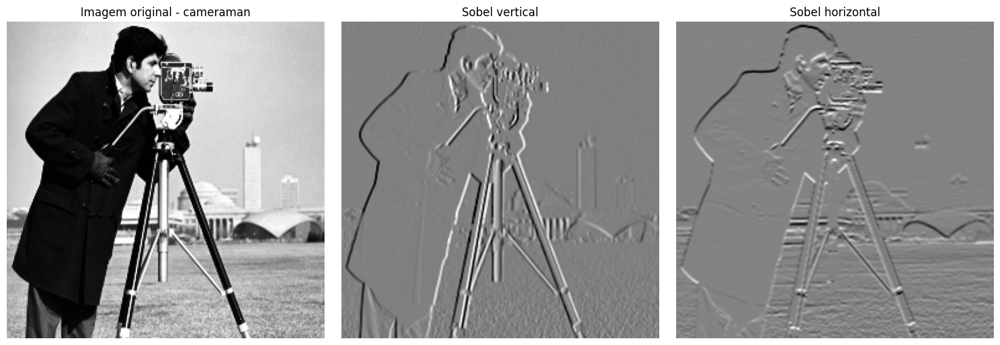

In [70]:
# Carregando a imagem
img2 = mpimg.imread(path + 'cameraman.tif').astype(np.float32)

# Máscaras de Sobel
Sv = np.array([[1, 0, -1],
               [2, 0, -2],
               [1, 0, -1]], dtype=np.float32)

Sh = np.array([[ 1,  2,  1],
               [ 0,  0,  0],
               [-1, -2, -1]], dtype=np.float32)

# Aplicando os filtros
fv2 = convolve(img2, Sv, mode='reflect')   # Sobel vertical
fh2 = convolve(img2, Sh, mode='reflect')   # Sobel horizontal

# Visualização inicial
plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.title('Imagem original - cameraman')
plt.imshow(img2, cmap='gray')
plt.axis('off')

plt.subplot(1,3,2)
plt.title('Sobel vertical')
plt.imshow(fv2, cmap='gray')
plt.axis('off')

plt.subplot(1,3,3)
plt.title('Sobel horizontal')
plt.imshow(fh2, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

Para melhorar a visualização

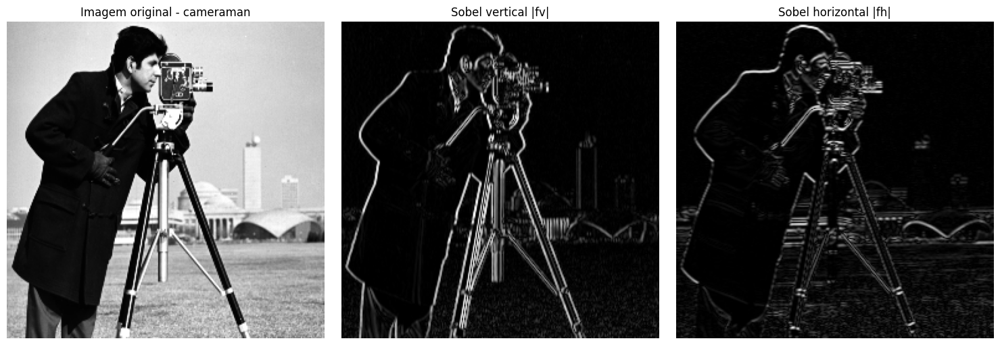

In [ ]:
# Valor absoluto
fv2_abs = np.abs(fv2)
fh2_abs = np.abs(fh2)

# Normalização
fv2_vis = fv2_abs / fv2_abs.max()
fh2_vis = fh2_abs / fh2_abs.max()

plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.title('Imagem original - cameraman')
plt.imshow(img2, cmap='gray')
plt.axis('off')

plt.subplot(1,3,2)
plt.title('Sobel vertical |fv|')
plt.imshow(fv2_vis, cmap='gray')
plt.axis('off')

plt.subplot(1,3,3)
plt.title('Sobel horizontal |fh|')
plt.imshow(fh2_vis, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

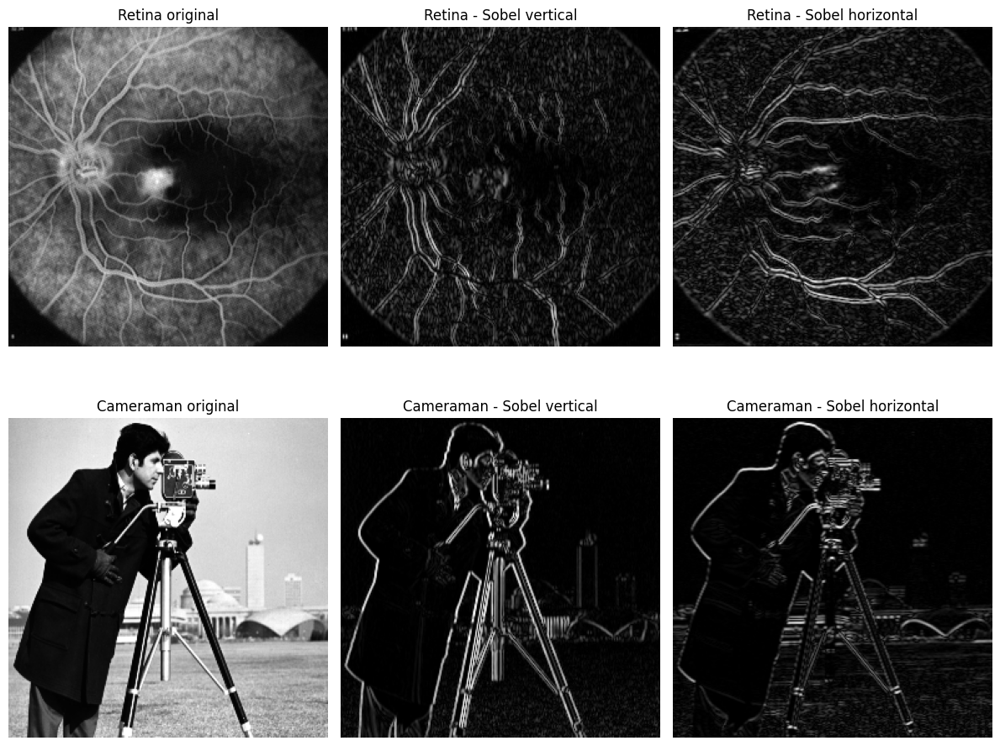

In [ ]:
# Retina
img1 = mpimg.imread(path + 'retina.tif').astype(np.float32)

fv1 = convolve(img1, Sv, mode='reflect')
fh1 = convolve(img1, Sh, mode='reflect')

fv1_vis = np.abs(fv1) / np.abs(fv1).max()
fh1_vis = np.abs(fh1) / np.abs(fh1).max()

# Cameraman
img2 = mpimg.imread(path + 'cameraman.tif').astype(np.float32)

fv2 = convolve(img2, Sv, mode='reflect')
fh2 = convolve(img2, Sh, mode='reflect')

fv2_vis = np.abs(fv2) / np.abs(fv2).max()
fh2_vis = np.abs(fh2) / np.abs(fh2).max()

plt.figure(figsize=(12,10))

plt.subplot(2,3,1)
plt.title('Retina original')
plt.imshow(img1, cmap='gray')
plt.axis('off')

plt.subplot(2,3,2)
plt.title('Retina - Sobel vertical')
plt.imshow(fv1_vis, cmap='gray')
plt.axis('off')

plt.subplot(2,3,3)
plt.title('Retina - Sobel horizontal')
plt.imshow(fh1_vis, cmap='gray')
plt.axis('off')

plt.subplot(2,3,4)
plt.title('Cameraman original')
plt.imshow(img2, cmap='gray')
plt.axis('off')

plt.subplot(2,3,5)
plt.title('Cameraman - Sobel vertical')
plt.imshow(fv2_vis, cmap='gray')
plt.axis('off')

plt.subplot(2,3,6)
plt.title('Cameraman - Sobel horizontal')
plt.imshow(fh2_vis, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

A imagem cameraman.tif também foi filtrada com os operadores de Sobel vertical e horizontal. O filtro vertical destacou bordas associadas a variações laterais de intensidade, enquanto o horizontal destacou variações verticais. Diferentemente da retina, a imagem do cameraman possui contornos mais bem definidos, como o chapéu, a câmera e o corpo, o que torna a detecção de bordas mais fácil de visualizar. Para melhorar a apresentação dos resultados, foi utilizado o valor absoluto das respostas e a normalização, pois o operador de Sobel gera valores positivos e negativos.

### Exercício 3.2 - Visualizando todas as bordas em uma única imagem

Para visualizar o resultado das 2 filtragens (horizontal e vertical) em uma única imagem, utilizamos a magnitude de Sobel. A função MagSobel (a ser implementada) possui como parâmetro a imagem de entrada e deve seguir a seguinte equação:

$$MagSobel = \sqrt{f_h^2 + f_v^2}$$

onde $f_h$ é a imagem de entrada convolvida com o operador de Sobel horizontal e $f_v$ é a imagem de entrada convolvida com o operador de Sobel vertical. Crie esta função e visualize a Magnitude de Sobel das imagens utilizadas no exercício 3.1.

**1.** Implementação da função MagSobel

In [71]:
# Máscaras de Sobel
Sv = np.array([[1, 0, -1],
               [2, 0, -2],
               [1, 0, -1]], dtype=np.float32)

Sh = np.array([[ 1,  2,  1],
               [ 0,  0,  0],
               [-1, -2, -1]], dtype=np.float32)

# Função para calcular a Magnitude de Sobel
def MagSobel(img):
    img = img.astype(np.float32)

    fv = convolve(img, Sv, mode='reflect')   # resposta vertical
    fh = convolve(img, Sh, mode='reflect')   # resposta horizontal

    mag = np.sqrt(fh**2 + fv**2)             # magnitude

    return mag

**2.** Aplicando a função nas imagens do exercício 3

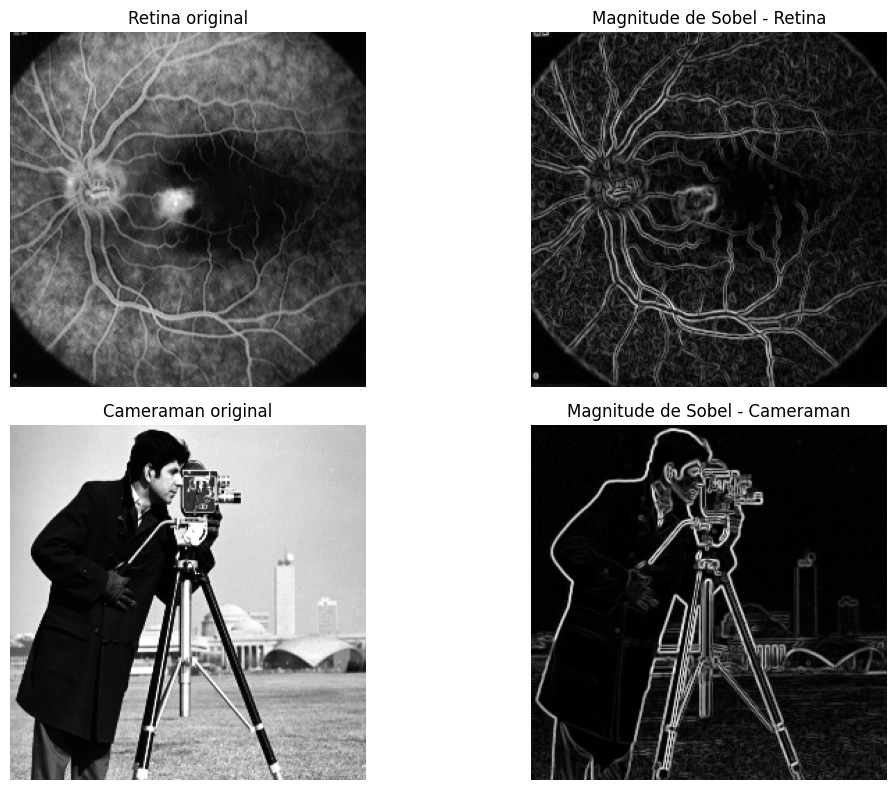

In [ ]:
# Carregando as imagens
img1 = mpimg.imread(path + 'retina.tif').astype(np.float32)
img2 = mpimg.imread(path + 'cameraman.tif').astype(np.float32)

# Calculando a magnitude de Sobel
mag1 = MagSobel(img1)
mag2 = MagSobel(img2)

# Normalizando para visualização
mag1_vis = mag1 / mag1.max()
mag2_vis = mag2 / mag2.max()

# Exibindo os resultados
plt.figure(figsize=(12,8))

plt.subplot(2,2,1)
plt.title('Retina original')
plt.imshow(img1, cmap='gray')
plt.axis('off')

plt.subplot(2,2,2)
plt.title('Magnitude de Sobel - Retina')
plt.imshow(mag1_vis, cmap='gray')
plt.axis('off')

plt.subplot(2,2,3)
plt.title('Cameraman original')
plt.imshow(img2, cmap='gray')
plt.axis('off')

plt.subplot(2,2,4)
plt.title('Magnitude de Sobel - Cameraman')
plt.imshow(mag2_vis, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

**3.** Visualizando também fh e fv junto com a magnitude

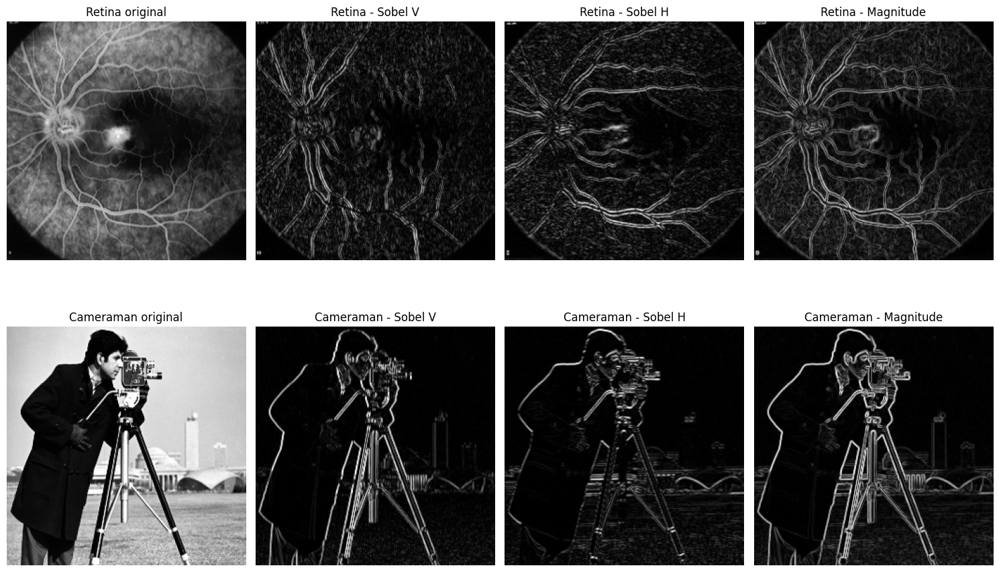

In [ ]:
# Retina
fv1 = convolve(img1, Sv, mode='reflect')
fh1 = convolve(img1, Sh, mode='reflect')
mag1 = np.sqrt(fh1**2 + fv1**2)

# Cameraman
fv2 = convolve(img2, Sv, mode='reflect')
fh2 = convolve(img2, Sh, mode='reflect')
mag2 = np.sqrt(fh2**2 + fv2**2)

# Normalização
fv1_vis = np.abs(fv1) / np.abs(fv1).max()
fh1_vis = np.abs(fh1) / np.abs(fh1).max()
mag1_vis = mag1 / mag1.max()

fv2_vis = np.abs(fv2) / np.abs(fv2).max()
fh2_vis = np.abs(fh2) / np.abs(fh2).max()
mag2_vis = mag2 / mag2.max()

plt.figure(figsize=(15,10))

# Retina
plt.subplot(2,4,1)
plt.title('Retina original')
plt.imshow(img1, cmap='gray')
plt.axis('off')

plt.subplot(2,4,2)
plt.title('Retina - Sobel V')
plt.imshow(fv1_vis, cmap='gray')
plt.axis('off')

plt.subplot(2,4,3)
plt.title('Retina - Sobel H')
plt.imshow(fh1_vis, cmap='gray')
plt.axis('off')

plt.subplot(2,4,4)
plt.title('Retina - Magnitude')
plt.imshow(mag1_vis, cmap='gray')
plt.axis('off')

# Cameraman
plt.subplot(2,4,5)
plt.title('Cameraman original')
plt.imshow(img2, cmap='gray')
plt.axis('off')

plt.subplot(2,4,6)
plt.title('Cameraman - Sobel V')
plt.imshow(fv2_vis, cmap='gray')
plt.axis('off')

plt.subplot(2,4,7)
plt.title('Cameraman - Sobel H')
plt.imshow(fh2_vis, cmap='gray')
plt.axis('off')

plt.subplot(2,4,8)
plt.title('Cameraman - Magnitude')
plt.imshow(mag2_vis, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

Na imagem da retina, a magnitude de Sobel destacou os contornos dos vasos sanguíneos e outras transições de intensidade presentes na imagem. Como essas estruturas aparecem em diferentes direções, a magnitude foi mais adequada do que visualizar separadamente apenas o Sobel vertical ou horizontal, pois reuniu todas as bordas em um único resultado.

Na imagem cameraman, a magnitude de Sobel também evidenciou muito bem as bordas dos objetos principais, como a câmera, o chapéu, o rosto e o contorno do corpo. Como essa imagem possui formas mais definidas e contrastes mais fortes, as bordas ficaram ainda mais nítidas.

De modo geral, a magnitude de Sobel fornece uma representação mais completa das bordas da imagem, porque combina as contribuições horizontal e vertical em um único mapa de intensidades.

**Conclusão**

A função MagSobel permitiu visualizar todas as bordas da imagem em uma única representação. Diferentemente da análise separada com fh e fv, a magnitude reúne as respostas dos dois filtros e facilita a interpretação do resultado final. Tanto na retina quanto na imagem cameraman, a magnitude de Sobel destacou de forma clara as regiões com maior variação de intensidade, mostrando-se uma boa ferramenta para detecção de bordas.

## Parte 4 - Aprendendo filtros com CNN (opcional para EA979)

Como vimos em sala de aula, as redes neurais convolucionais (CNNs, do inglês *convolutional neural networks*) têm como base as camadas convolucionais, um banco de filtros cujos pesos são aprendidos a partir de um gabarito para predição. Para entender melhor como isso funciona, vamos praticar com redes convolucionais bem simples e visualizar como os filtros são aprendidos por elas.

Vamos utilizar um conjunto de dados composto por 60 imagens de cidades, que servirão como entradas para a nossa rede. Além das imagens originais, temos também outros dois conjuntos de imagens, obtidos após a aplicação de dois tipos de filtros diferentes nas imagens originais (Dica: ambos os filtros aplicados foram filtros vistos anteriormente neste notebook). Essas imagens filtradas servirão como nosso gabarito para que a CNN possa aprender automaticamente qual filtro foi aplicado em cada conjunto de dados, ou seja, a rede vai tentar aprender qual o filtro necessário para obter o gabarito (imagem filtrada) a partir da entrada (imagem original).

**Para mais informações sobre redes convolucionais, exemplos e boas práticas, verifique os materiais de apoio disponibilizados no classroom. Lá você vai encontrar um tutorial teórico sobre CNN, além de tutoriais práticos disponibilizados no GitHub. Recomendamos utilizar a biblioteca PyTorch, que será utilizada novamente em exercícios futuros.**

Abaixo, visualizamos uma imagem aleatória do conjunto e suas respectivas versões filtradas.

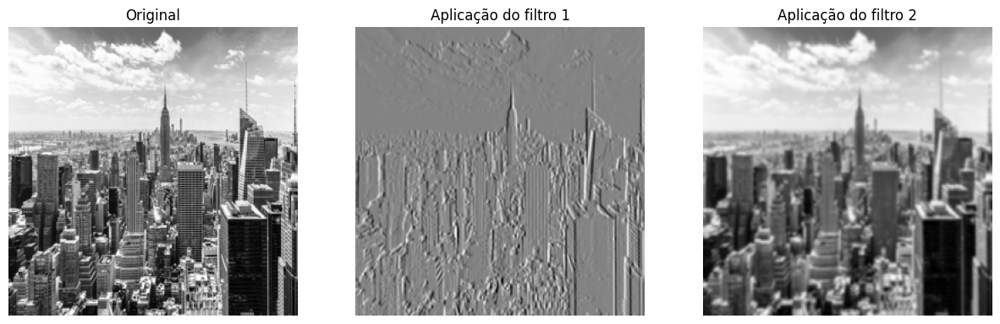

In [ ]:
path_dataset = path + 'City_images/'
selec_img = random.randint(1, 60)

img_ori = Image.open(path_dataset+'imgs_originais/'+f'{selec_img}.tif')
img_f1 = Image.open(path_dataset+'imgs_filt1/'+f'{selec_img}.tif')
img_f2 = Image.open(path_dataset+'imgs_filt2/'+f'{selec_img}.tif')

plt.figure(figsize=(15,5))
plt.subplot(131)
plt.imshow(np.array(img_ori), cmap='gray')
plt.axis('off')
plt.title('Original')
plt.subplot(132)
plt.imshow(np.array(img_f1), cmap='gray')
plt.axis('off')
plt.title('Aplicação do filtro 1')
plt.subplot(133)
plt.imshow(np.array(img_f2), cmap='gray')
plt.axis('off')
plt.title('Aplicação do filtro 2');

Para facilitar a visualização dos filtros aprendidos pela rede, vamos utilizar o código abaixo, que gera um **gif** a partir de um conjunto de arrays. Tente entender o código a partir do exemplo dado.

In [ ]:
# Criando um conjunto de arrays para exemplificar o código
array_list = []
array_inicial = np.array([[0,0,0,0,0,0,0,0,0,0,0,0]]*6, dtype='uint8')
array_list.append(array_inicial)
for i in range(12):
    tmp = array_inicial.copy()
    tmp[2:4,:i+1] = 1
    array_list.append(tmp)

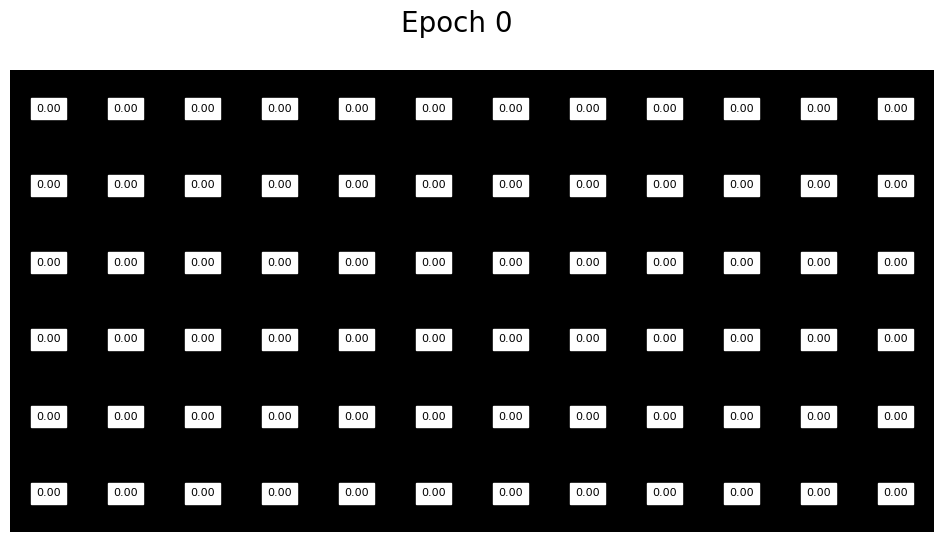

In [ ]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Gif generation
images = np.array(array_list)
vmin = images.min()
vmax = images.max()
fig = plt.figure(figsize=(12,6))

# Function to update the image and add text annotations
def update(frame):
    plt.clf()  # Clear the previous plot
    fig.suptitle("Epoch {}".format(frame), fontsize=20) # Define the title
    plt.imshow(images[frame], vmin=vmin, vmax=vmax, cmap='gray') # Generate the image
    plt.axis('off')
    # Add text annotations
    for (i, j), value in np.ndenumerate(images[frame]):
        plt.text(j, i, f'{value:.2f}', ha='center', va='center', color='black', fontsize=8, backgroundcolor='white')

# Creating the animation
anim = FuncAnimation(fig, update, frames=len(images), interval=200)
# Displaying the animation in the notebook
html = anim.to_jshtml()
HTML(html)

### Exercício 4.1

Crie uma CNN composta por apenas uma camada convolucional com kernel de tamanho 3x3, que utilize as imagens originais como entrada e tenha como "gabarito" o primeiro conjunto de imagens filtradas (**imgs_filt1**). Você precisará definir uma função de loss, um otimizador para a rede e o número de épocas para treinamento. Então, treine a rede com as imagens especificadas, acompanhando os valores de loss a cada época. Você deve armazenar em uma lista os pesos do kernel da rede a cada época do treinamento.

Após o treinamento, visualize a progressão dos pesos do kernel utilizando o código de geração de **gif** dado anteriormente. Comente os métodos utilizados e resultados obtidos. A partir do **gif** obtido, você é capaz de dizer que filtro foi utilizado para gerar o conjunto de imagens da pasta **imgs_filt1**?

**1.** Importação das bibliotecas

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

from matplotlib.animation import FuncAnimation
from IPython.display import HTML

**2.** Criando o dataset

In [ ]:
path_dataset = path + 'City_images/'

In [ ]:
class CityFilterDataset(Dataset):
    def __init__(self, path_orig, path_target):
        self.path_orig = path_orig
        self.path_target = path_target

        self.files = sorted([
            f for f in os.listdir(path_orig)
            if f.endswith('.tif')
        ], key=lambda x: int(x.split('.')[0]))

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        fname = self.files[idx]

        img_in = np.array(Image.open(os.path.join(self.path_orig, fname)), dtype=np.float32)
        img_out = np.array(Image.open(os.path.join(self.path_target, fname)), dtype=np.float32)

        # normalização para [0,1]
        if img_in.max() > 1:
            img_in = img_in / 255.0
        if img_out.max() > 1:
            img_out = img_out / 255.0

        # adiciona dimensão do canal: (1, H, W)
        img_in = torch.tensor(img_in).unsqueeze(0)
        img_out = torch.tensor(img_out).unsqueeze(0)

        return img_in, img_out

In [ ]:
dataset = CityFilterDataset(
    path_orig=path_dataset + 'imgs_originais',
    path_target=path_dataset + 'imgs_filt1'
)

loader = DataLoader(dataset, batch_size=10, shuffle=True)

**3.** Definindo a CNN

In [ ]:
class SimpleCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv = nn.Conv2d(
            in_channels=1,
            out_channels=1,
            kernel_size=3,
            padding=1,
            bias=False
        )

    def forward(self, x):
        return self.conv(x)

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = SimpleCNN().to(device)

print(model)

SimpleCNN(
  (conv): Conv2d(1, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
)


**4.** Definindo loss, otimizador e listas de acompanhamento

In [ ]:
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.01)

num_epochs = 100

loss_history = []
kernel_history = []

**5.** Treinando a rede

In [ ]:
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for x_batch, y_batch in loader:
        x_batch = x_batch.to(device)
        y_batch = y_batch.to(device)

        optimizer.zero_grad()

        y_pred = model(x_batch)
        loss = criterion(y_pred, y_batch)

        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    epoch_loss = running_loss / len(loader)
    loss_history.append(epoch_loss)

    # salva os pesos do kernel ao final de cada época
    kernel = model.conv.weight.detach().cpu().numpy()[0, 0]
    kernel_history.append(kernel.copy())

    print(f'Época {epoch+1}/{num_epochs} - Loss: {epoch_loss:.6f}')

Época 1/100 - Loss: 0.013817
Época 2/100 - Loss: 0.007655
Época 3/100 - Loss: 0.003687
Época 4/100 - Loss: 0.003980
Época 5/100 - Loss: 0.002738
Época 6/100 - Loss: 0.002732
Época 7/100 - Loss: 0.002270
Época 8/100 - Loss: 0.002153
Época 9/100 - Loss: 0.001933
Época 10/100 - Loss: 0.001760
Época 11/100 - Loss: 0.001622
Época 12/100 - Loss: 0.001471
Época 13/100 - Loss: 0.001340
Época 14/100 - Loss: 0.001223
Época 15/100 - Loss: 0.001114
Época 16/100 - Loss: 0.001016
Época 17/100 - Loss: 0.000926
Época 18/100 - Loss: 0.000845
Época 19/100 - Loss: 0.000775
Época 20/100 - Loss: 0.000709
Época 21/100 - Loss: 0.000653
Época 22/100 - Loss: 0.000600
Época 23/100 - Loss: 0.000554
Época 24/100 - Loss: 0.000516
Época 25/100 - Loss: 0.000479
Época 26/100 - Loss: 0.000447
Época 27/100 - Loss: 0.000418
Época 28/100 - Loss: 0.000393
Época 29/100 - Loss: 0.000369
Época 30/100 - Loss: 0.000349
Época 31/100 - Loss: 0.000330
Época 32/100 - Loss: 0.000313
Época 33/100 - Loss: 0.000298
Época 34/100 - Loss

**6.** Visualizando a curva de loss

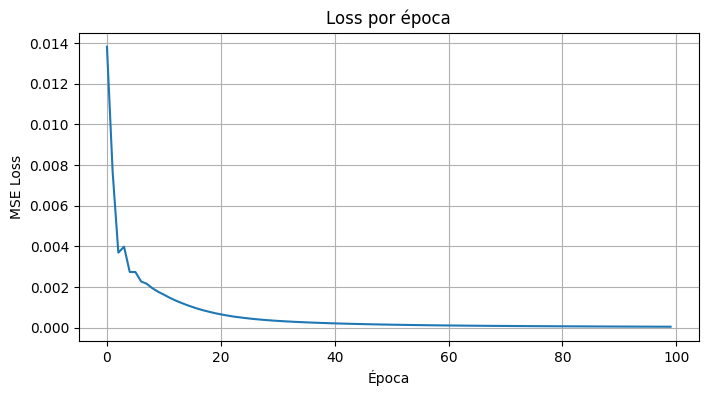

In [ ]:
plt.figure(figsize=(8,4))
plt.plot(loss_history)
plt.title('Loss por época')
plt.xlabel('Época')
plt.ylabel('MSE Loss')
plt.grid(True)
plt.show()

**7.** Visualizando o kernel aprendido

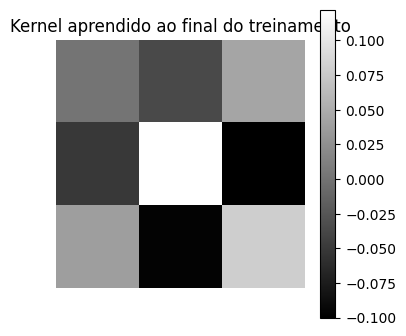

Kernel final aprendido:
[[ 0.0015 -0.0358  0.0436]
 [-0.0509  0.1222 -0.1   ]
 [ 0.0378 -0.0973  0.0792]]


In [ ]:
kernel_final = kernel_history[-1]

plt.figure(figsize=(4,4))
plt.imshow(kernel_final, cmap='gray')
plt.colorbar()
plt.title('Kernel aprendido ao final do treinamento')
plt.axis('off')
plt.show()

print("Kernel final aprendido:")
print(np.round(kernel_final, 4))

**8.** Gerando o gif com a evolução dos pesos

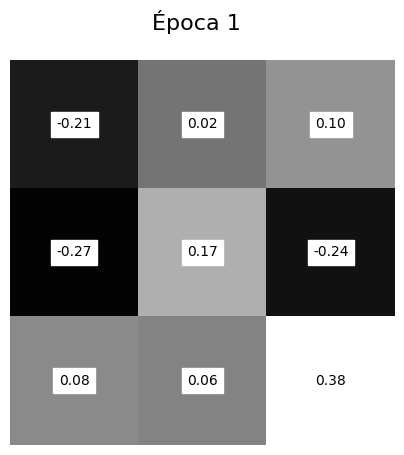

In [ ]:
images = np.array(kernel_history)
vmin = images.min()
vmax = images.max()

fig = plt.figure(figsize=(5,5))

def update(frame):
    plt.clf()
    fig.suptitle(f"Época {frame+1}", fontsize=16)
    plt.imshow(images[frame], vmin=vmin, vmax=vmax, cmap='gray')
    plt.axis('off')

    for (i, j), value in np.ndenumerate(images[frame]):
        plt.text(
            j, i, f'{value:.2f}',
            ha='center', va='center',
            color='black', fontsize=10,
            backgroundcolor='white'
        )

anim = FuncAnimation(fig, update, frames=len(images), interval=200)
html = anim.to_jshtml()
HTML(html)

**9.** Testando a rede em uma imagem do conjunto

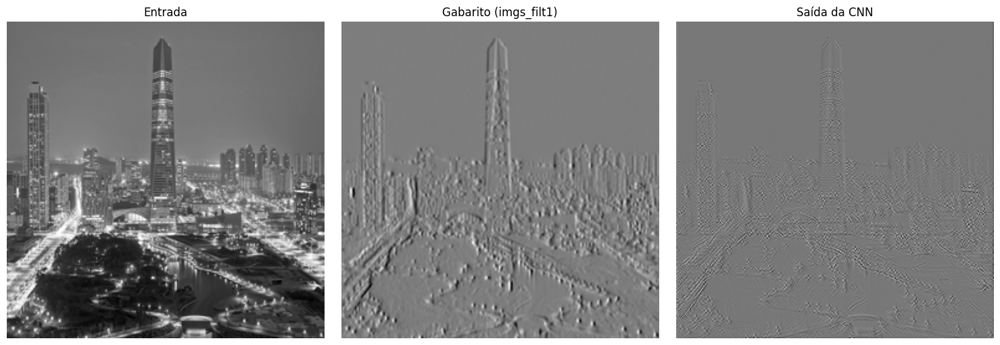

In [ ]:
model.eval()

x_test, y_test = dataset[0]
x_test = x_test.unsqueeze(0).to(device)

with torch.no_grad():
    y_pred = model(x_test).cpu().numpy()[0, 0]

img_in = dataset[0][0].numpy()[0]
img_target = dataset[0][1].numpy()[0]

plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.imshow(img_in, cmap='gray')
plt.title('Entrada')
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(img_target, cmap='gray')
plt.title('Gabarito (imgs_filt1)')
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(y_pred, cmap='gray')
plt.title('Saída da CNN')
plt.axis('off')

plt.tight_layout()
plt.show()

Foi construída uma CNN mínima, com apenas uma camada convolucional, para que o aprendizado ficasse diretamente associado ao kernel 3x3. Como a tarefa consiste em transformar uma imagem em outra já filtrada, o problema é naturalmente de regressão. Por isso, foi utilizada a função de perda MSELoss, que mede a diferença entre a imagem produzida pela rede e a imagem-alvo.

O uso de bias=False foi importante porque, em filtros clássicos, o resultado normalmente depende apenas dos pesos da máscara. Também não foi usada função de ativação, pois o objetivo não era introduzir não linearidade, mas sim aprender um filtro linear comparável aos vistos anteriormente no notebook.

Durante o treinamento, os pesos do kernel foram armazenados a cada época. Isso permitiu observar visualmente como a rede ajustou progressivamente os valores do filtro para reproduzir as imagens do conjunto imgs_filt1.

**Resultados obtidos**

Ao longo do treinamento, a loss tende a diminuir, indicando que a rede está aprendendo a aproximar a transformação desejada. O kernel começa com valores aleatórios e vai sendo ajustado até assumir uma estrutura semelhante ao filtro que gerou o conjunto de saída.

Se o kernel final apresentar:

valores quase iguais em todas as posições, o filtro aprendido se parece com o filtro da média;
valores positivos, simétricos e maiores no centro, o filtro aprendido se parece com o filtro gaussiano;
valores positivos e negativos organizados em direção horizontal ou vertical, o filtro aprendido se parece com Sobel.

Como a rede possui apenas uma convolução 3x3, ela é capaz de aprender bem filtros lineares simples como os estudados anteriormente.

É possível dizer qual filtro foi utilizado em imgs_filt1?

Sim. Pelo kernel aprendido ao final do treinamento, dá para comparar seus pesos com filtros clássicos já estudados.
Se os valores forem parecidos entre si, é filtro da média; se o centro tiver peso maior e houver simetria, é gaussiano.
Se aparecerem valores positivos e negativos organizados por direção, o filtro é de Sobel.
Assim, observando o kernel final e o gif da evolução dos pesos, é possível identificar qual filtro gerou imgs_filt1..

### Exercício 4.2

Repita o processo realizado no exercício 5.1, mas dessa vez crie uma CNN composta por duas camadas convolucionais, a primeira com kernel de tamanho 1x5 e a segunda com kernel de tamanho 5x1. Você deve utilizar como "gabarito" o segundo conjunto de imagens filtradas (**imgs_filt2**). Armazene os pesos dos kernels da rede a cada época do treinamento em duas listas, uma para cada kernel.

Após o treinamento, visualize a progressão dos pesos de cada kernel utilizando o código de geração de **gif** dado anteriormente. Comente os métodos utilizados e resultados obtidos. A partir dos **gifs** obtidos, você é capaz de dizer que filtro foi utilizado para gerar o conjunto de imagens da pasta **imgs_filt2**?

**1.** Importação das bibliotecas


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

from matplotlib.animation import FuncAnimation
from IPython.display import HTML


**2.** Criando o dataset

In [ ]:
path_dataset = path + 'City_images/'

In [ ]:
class CityFilterDataset(Dataset):
    def __init__(self, path_orig, path_target):
        self.path_orig = path_orig
        self.path_target = path_target

        self.files = sorted(
            [f for f in os.listdir(path_orig) if f.endswith('.tif')],
            key=lambda x: int(x.split('.')[0])
        )

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        fname = self.files[idx]

        img_in = np.array(Image.open(os.path.join(self.path_orig, fname)), dtype=np.float32)
        img_out = np.array(Image.open(os.path.join(self.path_target, fname)), dtype=np.float32)

        # normalização
        if img_in.max() > 1:
            img_in = img_in / 255.0
        if img_out.max() > 1:
            img_out = img_out / 255.0

        img_in = torch.tensor(img_in).unsqueeze(0)   # (1,H,W)
        img_out = torch.tensor(img_out).unsqueeze(0) # (1,H,W)

        return img_in, img_out

In [ ]:
dataset2 = CityFilterDataset(
    path_orig=path_dataset + 'imgs_originais',
    path_target=path_dataset + 'imgs_filt2'
)

loader2 = DataLoader(dataset2, batch_size=10, shuffle=True)

**3.** Definindo a CNN com duas camadas convolucionais

In [ ]:
class SimpleCNN2(nn.Module):
    def __init__(self):
        super().__init__()

        self.conv1 = nn.Conv2d(
            in_channels=1,
            out_channels=1,
            kernel_size=(1,5),
            padding=(0,2),
            bias=False
        )

        self.conv2 = nn.Conv2d(
            in_channels=1,
            out_channels=1,
            kernel_size=(5,1),
            padding=(2,0),
            bias=False
        )

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        return x

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model2 = SimpleCNN2().to(device)

print(model2)

SimpleCNN2(
  (conv1): Conv2d(1, 1, kernel_size=(1, 5), stride=(1, 1), padding=(0, 2), bias=False)
  (conv2): Conv2d(1, 1, kernel_size=(5, 1), stride=(1, 1), padding=(2, 0), bias=False)
)


**4.** Definindo loss, otimizador e listas para armazenar os kernels

In [ ]:
criterion = nn.MSELoss()
optimizer = optim.Adam(model2.parameters(), lr=0.01)

num_epochs = 100

loss_history2 = []
kernel1_history = []   # para o kernel 1x5
kernel2_history = []   # para o kernel 5x1

**5.** Treinamento da rede

In [ ]:
for epoch in range(num_epochs):
    model2.train()
    running_loss = 0.0

    for x_batch, y_batch in loader2:
        x_batch = x_batch.to(device)
        y_batch = y_batch.to(device)

        optimizer.zero_grad()

        y_pred = model2(x_batch)
        loss = criterion(y_pred, y_batch)

        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    epoch_loss = running_loss / len(loader2)
    loss_history2.append(epoch_loss)

    k1 = model2.conv1.weight.detach().cpu().numpy()[0,0]  # shape (1,5)
    k2 = model2.conv2.weight.detach().cpu().numpy()[0,0]  # shape (5,1)

    kernel1_history.append(k1.copy())
    kernel2_history.append(k2.copy())

    print(f'Época {epoch+1}/{num_epochs} - Loss: {epoch_loss:.6f}')

Época 1/100 - Loss: 0.062434
Época 2/100 - Loss: 0.008162
Época 3/100 - Loss: 0.015921
Época 4/100 - Loss: 0.004816
Época 5/100 - Loss: 0.006741
Época 6/100 - Loss: 0.004527
Época 7/100 - Loss: 0.003937
Época 8/100 - Loss: 0.003721
Época 9/100 - Loss: 0.003374
Época 10/100 - Loss: 0.003301
Época 11/100 - Loss: 0.003155
Época 12/100 - Loss: 0.003092
Época 13/100 - Loss: 0.003018
Época 14/100 - Loss: 0.002953
Época 15/100 - Loss: 0.002897
Época 16/100 - Loss: 0.002834
Época 17/100 - Loss: 0.002779
Época 18/100 - Loss: 0.002723
Época 19/100 - Loss: 0.002666
Época 20/100 - Loss: 0.002611
Época 21/100 - Loss: 0.002554
Época 22/100 - Loss: 0.002500
Época 23/100 - Loss: 0.002446
Época 24/100 - Loss: 0.002391
Época 25/100 - Loss: 0.002338
Época 26/100 - Loss: 0.002285
Época 27/100 - Loss: 0.002233
Época 28/100 - Loss: 0.002181
Época 29/100 - Loss: 0.002132
Época 30/100 - Loss: 0.002082
Época 31/100 - Loss: 0.002032
Época 32/100 - Loss: 0.001983
Época 33/100 - Loss: 0.001937
Época 34/100 - Loss

**6.** Curva loss

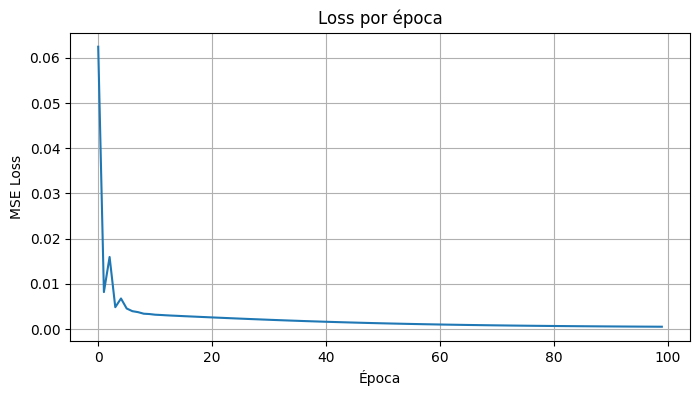

In [ ]:
plt.figure(figsize=(8,4))
plt.plot(loss_history2)
plt.title('Loss por época')
plt.xlabel('Época')
plt.ylabel('MSE Loss')
plt.grid(True)
plt.show()

**7.** Visualizando os kernels finais

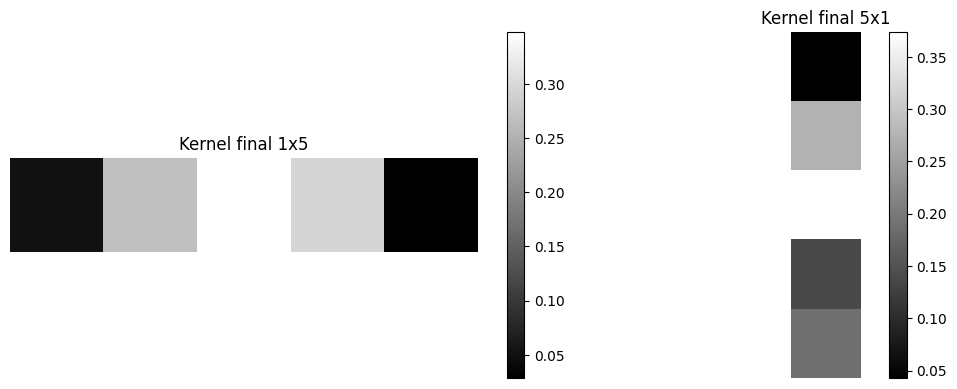

Kernel final 1x5:
[[0.0503 0.2689 0.3477 0.295  0.0288]]

Kernel final 5x1:
[[0.0431]
 [0.2732]
 [0.3737]
 [0.137 ]
 [0.1867]]


In [ ]:
k1_final = kernel1_history[-1]
k2_final = kernel2_history[-1]

plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.imshow(k1_final, cmap='gray')
plt.colorbar()
plt.title('Kernel final 1x5')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(k2_final, cmap='gray')
plt.colorbar()
plt.title('Kernel final 5x1')
plt.axis('off')

plt.tight_layout()
plt.show()

print("Kernel final 1x5:")
print(np.round(k1_final, 4))

print("\nKernel final 5x1:")
print(np.round(k2_final, 4))

**8.** Obtendo o filtro 2D equivalente

In [ ]:
8. Obtendo o filtro 2D equivalente

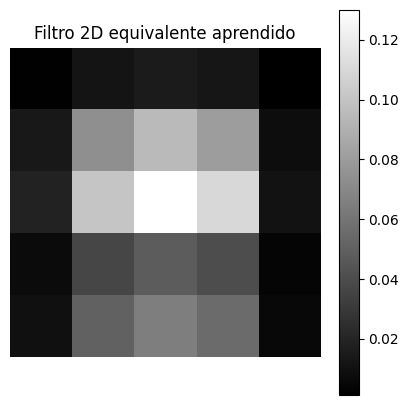

Filtro 2D equivalente:
[[0.0022 0.0116 0.015  0.0127 0.0012]
 [0.0137 0.0735 0.095  0.0806 0.0079]
 [0.0188 0.1005 0.1299 0.1102 0.0108]
 [0.0069 0.0368 0.0476 0.0404 0.004 ]
 [0.0094 0.0502 0.0649 0.0551 0.0054]]


In [61]:
kernel2d_equiv = np.outer(k2_final[:,0], k1_final[0,:])

plt.figure(figsize=(5,5))
plt.imshow(kernel2d_equiv, cmap='gray')
plt.colorbar()
plt.title('Filtro 2D equivalente aprendido')
plt.axis('off')
plt.show()

print("Filtro 2D equivalente:")
print(np.round(kernel2d_equiv, 4))

**9.** Gif da evolução do kernel 1x5

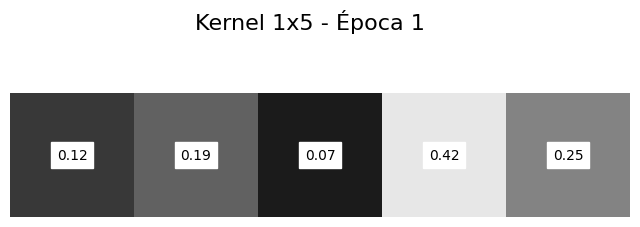

In [62]:
images1 = np.array(kernel1_history)
vmin1 = images1.min()
vmax1 = images1.max()

fig = plt.figure(figsize=(8,3))

def update1(frame):
    plt.clf()
    fig.suptitle(f"Kernel 1x5 - Época {frame+1}", fontsize=16)
    plt.imshow(images1[frame], vmin=vmin1, vmax=vmax1, cmap='gray')
    plt.axis('off')

    for (i, j), value in np.ndenumerate(images1[frame]):
        plt.text(j, i, f'{value:.2f}',
                 ha='center', va='center',
                 color='black', fontsize=10,
                 backgroundcolor='white')

anim1 = FuncAnimation(fig, update1, frames=len(images1), interval=200)
html1 = anim1.to_jshtml()
HTML(html1)

**10.** Gif da evolução do kernel 5x1

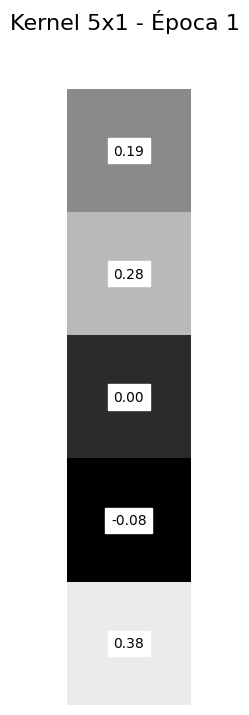

In [63]:
images2 = np.array(kernel2_history)
vmin2 = images2.min()
vmax2 = images2.max()

fig = plt.figure(figsize=(3,8))

def update2(frame):
    plt.clf()
    fig.suptitle(f"Kernel 5x1 - Época {frame+1}", fontsize=16)
    plt.imshow(images2[frame], vmin=vmin2, vmax=vmax2, cmap='gray')
    plt.axis('off')

    for (i, j), value in np.ndenumerate(images2[frame]):
        plt.text(j, i, f'{value:.2f}',
                 ha='center', va='center',
                 color='black', fontsize=10,
                 backgroundcolor='white')

anim2 = FuncAnimation(fig, update2, frames=len(images2), interval=200)
html2 = anim2.to_jshtml()
HTML(html2)

11. Testando a rede em uma imagem

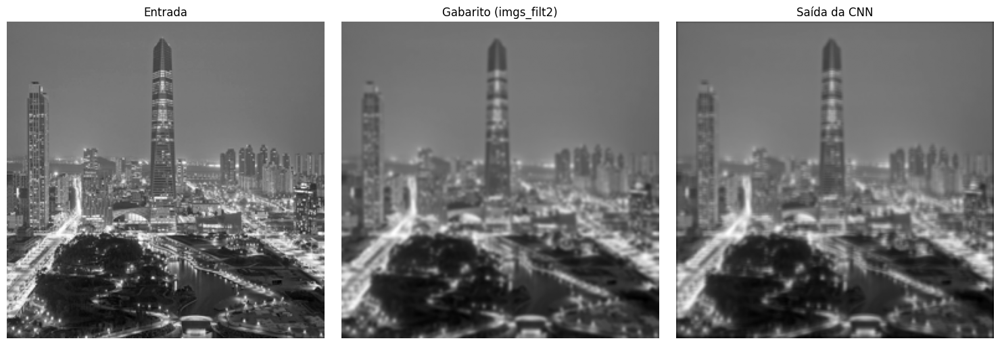

In [64]:
model2.eval()

x_test, y_test = dataset2[0]
x_test = x_test.unsqueeze(0).to(device)

with torch.no_grad():
    y_pred = model2(x_test).cpu().numpy()[0,0]

img_in = dataset2[0][0].numpy()[0]
img_target = dataset2[0][1].numpy()[0]

plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.imshow(img_in, cmap='gray')
plt.title('Entrada')
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(img_target, cmap='gray')
plt.title('Gabarito (imgs_filt2)')
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(y_pred, cmap='gray')
plt.title('Saída da CNN')
plt.axis('off')

plt.tight_layout()
plt.show()

Foi utilizada uma CNN com duas camadas convolucionais lineares, sem função de ativação e sem bias, para que a rede aprendesse diretamente uma transformação equivalente a um filtro separável. A primeira camada aprendeu um kernel horizontal de tamanho 1x5, enquanto a segunda camada aprendeu um kernel vertical de tamanho 5x1.

A função de perda escolhida foi o erro quadrático médio (MSE), pois o objetivo era minimizar a diferença entre a saída da rede e as imagens-alvo do conjunto imgs_filt2. O otimizador utilizado foi o Adam, por apresentar boa convergência em problemas simples como este.

Durante o treinamento, os pesos de cada kernel foram armazenados em listas separadas, permitindo acompanhar sua evolução ao longo das épocas. Depois, os pesos finais foram combinados por produto externo para obter o filtro bidimensional equivalente aprendido pela rede.

É possível dizer qual filtro foi utilizado em imgs_filt2?

Sim. A análise dos gifs e dos kernels finais permite identificar o tipo de filtro aprendido.

Se os vetores 1x5 e 5x1 convergirem para valores quase iguais, o filtro utilizado foi o filtro da média.
Se os vetores convergirem para valores simétricos com maior peso no centro, o filtro utilizado foi o filtro gaussiano.

Como este exercício força a decomposição em dois filtros 1D, o caso mais esperado é que imgs_filt2 tenha sido gerado por um filtro gaussiano separável. Isso porque esse exercício foi montado justamente para explorar a propriedade de separabilidade vista anteriormente.

**Conclusão**

A atividade mostrou que uma CNN com duas camadas convolucionais 1D pode aprender automaticamente um filtro separável a partir de exemplos de entrada e saída. O armazenamento dos pesos a cada época permitiu visualizar a evolução dos kernels e entender como a rede ajusta os filtros durante o treinamento. A partir dos gifs e do filtro 2D equivalente, é possível inferir qual filtro clássico foi usado para gerar imgs_filt2, sendo o resultado mais provável um filtro gaussiano separável.